In [1]:
%reload_ext autoreload
%autoreload 2

import brian2 as b2
import brian2hears as b2h
import scipy.io as sio
import pandas as pd
import numpy as np
import os
from simulate.models.BrainstemModel.params import Parameters as params
from simulate.cochleas.ZilanyCochlea import run_repeated_sound_psth
from analyze.report import plot_sound, plot_rasterplot
from utils.anf_utils import load_anf_response, ZI_COC_KEY, CI_COC_KEY
from utils.custom_sounds import Tone, WhiteNoise, Click, Click_Train
from utils.hrtf_utils import run_hrtf
from utils.path_utils import Paths


✅ Using local cochlea package from: /Users/francescodesantis/Documents/repos/sound_localization_model/external/cochlea-1
2026-03-30 18:21:28,584 [INFO ]  

>>>>> start execution
✅ Using local cochlea package from: /Users/francescodesantis/Documents/repos/sound_localization_model/external/cochlea-1

              -- N E S T --
  Copyright (C) 2004 The NEST Initiative

 Version: 3.8.0
 Built: Jul 24 2025 05:26:03

 This program is provided AS IS and comes with
 NO WARRANTY. See the file LICENSE for details.

 Problems or suggestions?
   Visit https://www.nest-simulator.org

 Type 'nest.help()' to find out more about NEST.




How to cite *cochlea*:

Rudnicki M. and Hemmert W. (2009—). Cochlea: inner ear models in
Python.  https://github.com/mrkrd/cochlea/

@Misc{Rudnicki2009-Cochlea,
  author       = {Rudnicki, M. and Hemmert, W.},
  title        = {Cochlea: inner ear models in Python},
  year         = {2009--},
  howpublished = {https://github.com/mrkrd/cochlea},
  url          = {https://github.com/mrkrd/cochlea},
}



In [2]:
f = 500
level = 60 * b2h.dB
duration = 50 * b2.ms
ramp = 10
angle = 0


sound = Tone(f * b2.Hz, duration=duration, level=level, ramp_ms=ramp, offset_silence_duration=50 * b2.ms)
#sound = WhiteNoise(duration=duration, level=level, ramp_ms=ramp, offset_silence_duration=50 * b2.ms)
#sound = Click(duration=duration, click_duration=1* b2.ms, level=70 * b2h.dB)
# sound = Click_Train(duration=duration, click_duration=0.05*b2.ms, level=70 * b2h.dB, interval=5*b2.ms),


p = params()
anf = load_anf_response(sound, angle, ZI_COC_KEY, p.cochlea)

2026-03-30 18:21:29,245 [INFO ]  Subject chosen: 0
2026-03-30 18:21:29,248 [INFO ]  [load_anf_response] Generating ANF for sound=<utils.custom_sounds.Tone object at 0x108b6eac0>, angle=0, key=Zilany


In [3]:
spikes = anf.binaural_anf_spiketrain['L']
spikes_ci = anf_ci.binaural_anf_spiketrain['L']

(spikes.apply(len) == 0).sum()
(spikes_ci.apply(len) == 0).sum()

NameError: name 'anf_ci' is not defined

In [19]:
spikes

0        [0.000640000000000001, 0.007229999999999872, 0...
1        [0.007519999999999862, 0.0147099999999996, 0.0...
2        [0.003350000000000008, 0.007409999999999873, 0...
3        [0.013029999999999637, 0.06319000000000823, 0....
4        [0.008009999999999842, 0.02853999999999904, 0....
                               ...                        
34995    [0.016339999999999504, 0.021559999999999323, 0...
34996                                [0.06888000000000599]
34997                                [0.08007000000000165]
34998                                                   []
34999                                                   []
Name: spikes, Length: 35000, dtype: object

In [20]:
spikes_ci

0        [0.0025, 0.0046, 0.0067, 0.0087, 0.0111, 0.013...
1                                                       []
2                                 [0.0102, 0.0213, 0.0336]
3        [0.0032, 0.0078, 0.012, 0.0164, 0.0209, 0.0254...
4        [0.0036, 0.008, 0.0114, 0.017, 0.0225, 0.0271,...
                               ...                        
34995                                                   []
34996                                                   []
34997                                                   []
34998                                                   []
34999                                                   []
Name: spikes, Length: 35000, dtype: object

In [32]:
s = []
# make sure all ANFs have a spiking array and no zero-time spikes are present
for i in range(3):
    spiketimes = np.array(spikes.get(i, []))
    print(spiketimes)
    s.append(spiketimes[spiketimes != 0])
    print(s)

[0.00064 0.00723 0.01651 0.04113 0.06479 0.09972]
[array([0.00064, 0.00723, 0.01651, 0.04113, 0.06479, 0.09972])]
[0.00752 0.01471 0.02987 0.03171 0.03391 0.05092 0.063   0.08064 0.09881]
[array([0.00064, 0.00723, 0.01651, 0.04113, 0.06479, 0.09972]), array([0.00752, 0.01471, 0.02987, 0.03171, 0.03391, 0.05092, 0.063  ,
       0.08064, 0.09881])]
[0.00335 0.00741 0.0106  0.02182 0.03335 0.03877 0.04756 0.05542 0.06195
 0.0649  0.08135 0.09654]
[array([0.00064, 0.00723, 0.01651, 0.04113, 0.06479, 0.09972]), array([0.00752, 0.01471, 0.02987, 0.03171, 0.03391, 0.05092, 0.063  ,
       0.08064, 0.09881]), array([0.00335, 0.00741, 0.0106 , 0.02182, 0.03335, 0.03877, 0.04756,
       0.05542, 0.06195, 0.0649 , 0.08135, 0.09654])]


In [30]:
s = []
# make sure all ANFs have a spiking array and no zero-time spikes are present
for i in range(3):
    spiketimes = np.array(spikes_ci.get(i, []))
    print(spiketimes)
    s.append(spiketimes[spiketimes != 0])
    print(s)

[0.0025 0.0046 0.0067 0.0087 0.0111 0.0132 0.0156 0.0178 0.0201 0.0222
 0.0244 0.0266 0.0287 0.0311 0.0335 0.0356 0.0378 0.0402 0.0421 0.0447]
[array([0.0025, 0.0046, 0.0067, 0.0087, 0.0111, 0.0132, 0.0156, 0.0178,
       0.0201, 0.0222, 0.0244, 0.0266, 0.0287, 0.0311, 0.0335, 0.0356,
       0.0378, 0.0402, 0.0421, 0.0447])]
[]
[array([0.0025, 0.0046, 0.0067, 0.0087, 0.0111, 0.0132, 0.0156, 0.0178,
       0.0201, 0.0222, 0.0244, 0.0266, 0.0287, 0.0311, 0.0335, 0.0356,
       0.0378, 0.0402, 0.0421, 0.0447]), array([], dtype=float64)]
[0.0102 0.0213 0.0336]
[array([0.0025, 0.0046, 0.0067, 0.0087, 0.0111, 0.0132, 0.0156, 0.0178,
       0.0201, 0.0222, 0.0244, 0.0266, 0.0287, 0.0311, 0.0335, 0.0356,
       0.0378, 0.0402, 0.0421, 0.0447]), array([], dtype=float64), array([0.0102, 0.0213, 0.0336])]


Avg firing rate: 55.36 Hz
Avg firing rate: 55.28 Hz


(<Figure size 1500x800 with 3 Axes>,
 (<Axes: ylabel='CF [Hz]'>,
  <Axes: xlabel='Avg rate [Hz]'>,
  <Axes: xlabel='Time (ms)', ylabel='Rate [Hz]'>))

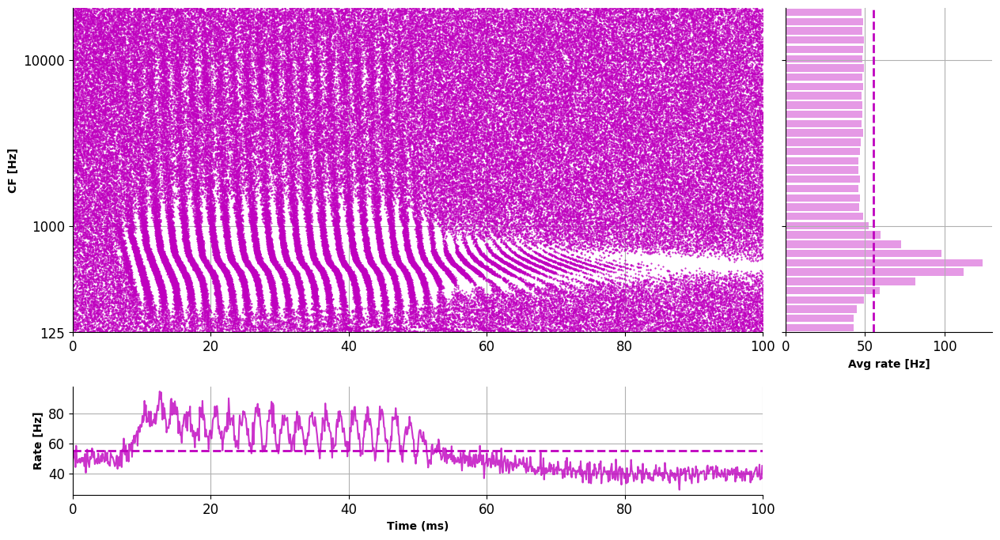

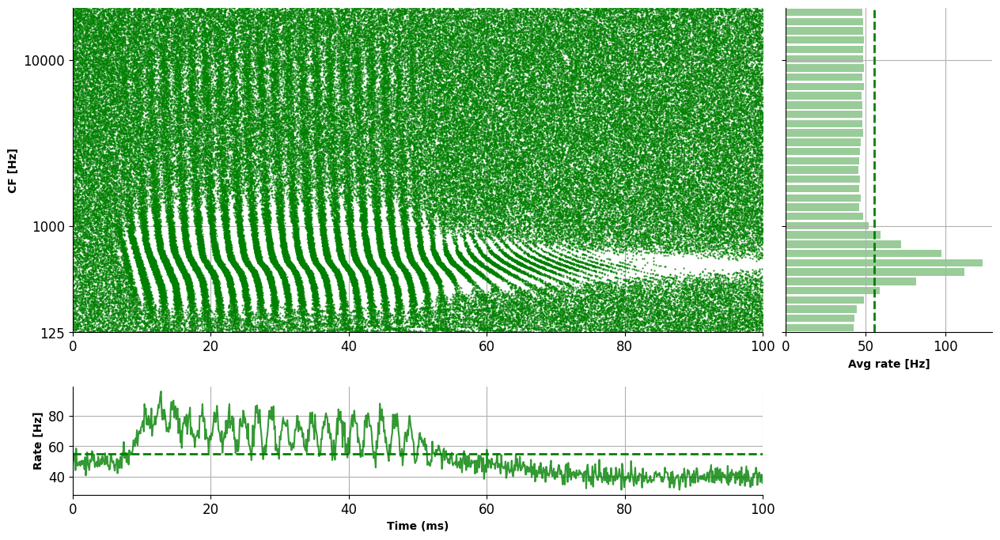

In [10]:
plot_rasterplot(
    spikes_series = anf.binaural_anf_spiketrain['L'],
    y_ax='cf_custom',
    f_ticks=[125, 1000, 10000],
    hist_rate=True,
    cf_bin_size=1000, #cells
    psth_bin_size=0.1, #ms
    color='m',
)

plot_rasterplot(
    spikes_series = anf.binaural_anf_spiketrain['R'],
    y_ax='cf_custom',
    f_ticks=[125, 1000, 10000],
    hist_rate=True,
    cf_bin_size=1000, #cells
    psth_bin_size=0.1, #ms
    color='g',
)

In [7]:
anf_ci = load_anf_response(sound, 0, CI_COC_KEY, p.cochlea)

2026-03-30 18:29:47,750 [INFO ]  Subject chosen: 0
2026-03-30 18:29:47,754 [INFO ]  [load_anf_response] Saved ANF not found. Regenerating...
2026-03-30 18:29:47,755 [INFO ]  [load_anf_response] Generating ANF for sound=<utils.custom_sounds.Tone object at 0x108b6eac0>, angle=0, key=CI
2026-03-30 18:29:47,756 [INFO ]  [CICochlea] Generating ANF spikes — angle=0
2026-03-30 18:29:47,756 [DEBUG]  [CICochlea] Running HRTF...
2026-03-30 18:29:47,756 [DEBUG]  [run_hrtf] Starting HRTF for angle=0 subj=0
2026-03-30 18:29:47,773 [DEBUG]  [CICochlea] Resampling to 16000 Hz...
2026-03-30 18:29:47,774 [DEBUG]  [CICochlea] Writing WAVs to /var/folders/ll/11knr8bs6_nbxy20yw3f5kfh0000gn/T/ci_cochlea_wni54ln6
2026-03-30 18:29:47,774 [INFO ]  [CICochlea] Launching MATLAB: /Applications/MATLAB_R2025b.app/Contents/MacOS/MATLAB -nodisplay -nosplash -batch addpath('/Users/francescodesantis/Documents/repos/sound_localization_model/scripts'); run_CI_cochlea('/var/folders/ll/11knr8bs6_nbxy20yw3f5kfh0000gn/T/ci_

In [5]:
len(anf_ci.binaural_anf_spiketrain['L'])

35000

In [8]:
anf_ci

AnfResponse(binaural_anf_spiketrain={'L': 0          [0.0069, 0.0136, 0.0181, 0.0236, 0.0292, 0.038]
1                                                       []
2         [0.0057, 0.0115, 0.0174, 0.0227, 0.0294, 0.0352]
3        [0.0058, 0.0134, 0.019, 0.0245, 0.029, 0.0346,...
4        [0.0037, 0.0081, 0.0126, 0.0159, 0.0203, 0.023...
                               ...                        
34995                                                   []
34996                                                   []
34997                                                   []
34998                                                   []
34999                                                   []
Name: spikes, Length: 35000, dtype: object, 'R': 0                                              []
1                                              []
2        [0.0073, 0.0162, 0.0218, 0.0316, 0.0384]
3                                              []
4                                              []
          

Avg firing rate: 115.72 Hz
Avg firing rate: 117.83 Hz


(<Figure size 1500x800 with 3 Axes>,
 (<Axes: ylabel='CF [Hz]'>,
  <Axes: xlabel='Avg rate [Hz]'>,
  <Axes: xlabel='Time (ms)', ylabel='Rate [Hz]'>))

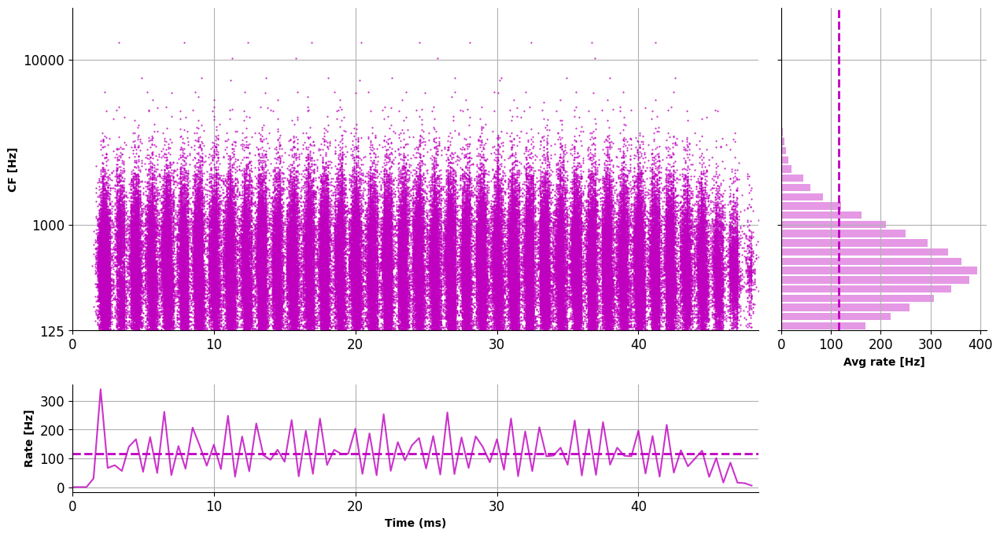

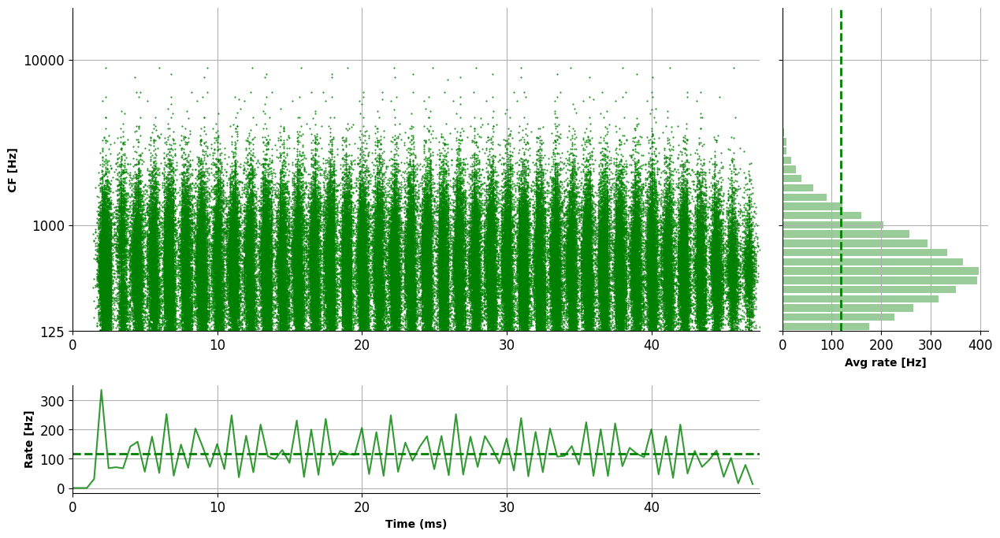

In [12]:
plot_rasterplot(
    spikes_series = anf_ci.binaural_anf_spiketrain['L'],
    y_ax='cf_custom',
    f_ticks=[125, 1000, 10000],
    hist_rate=True,
    cf_bin_size=1000, #cells
    psth_bin_size=0.5, #ms
    color='m',
)

plot_rasterplot(
    spikes_series = anf_ci.binaural_anf_spiketrain['R'],
    y_ax='cf_custom',
    f_ticks=[125, 1000, 10000],
    hist_rate=True,
    cf_bin_size=1000, #cells
    psth_bin_size=0.5, #ms
    color='g',
)

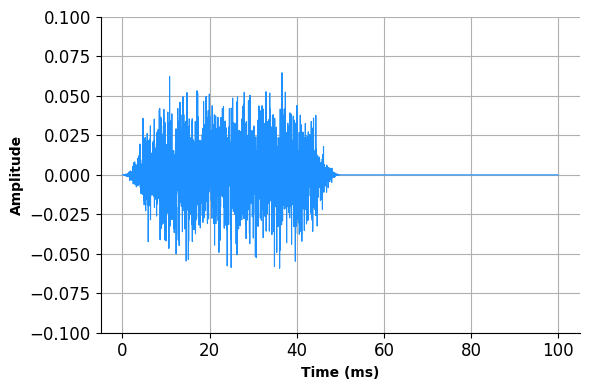

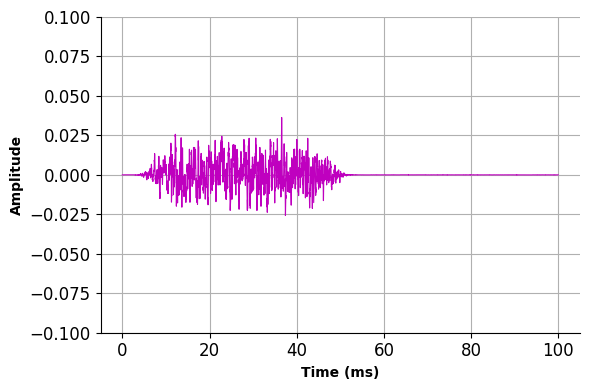

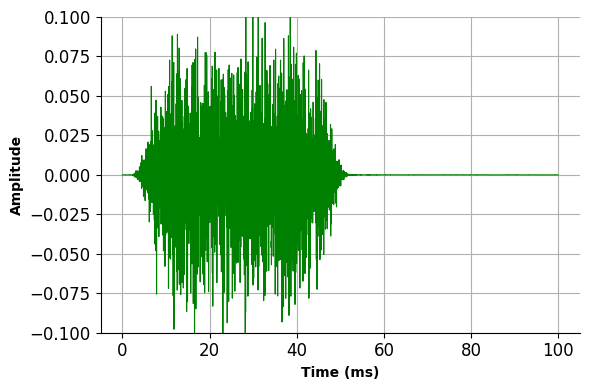

In [ ]:
plot_sound(sound.sound, color = 'dodgerblue', ylim=(-0.1, 0.1))
plot_sound(anf.l_hrtf_sound, color='m', ylim=(-0.1, 0.1))
plot_sound(anf.r_hrtf_sound, color='g', ylim=(-0.1, 0.1))
anf.l_hrtf_sound.save('../../../../Desktop/CI_Model_1/wavfilestore/binaural_left_wn.wav')
anf.r_hrtf_sound.save('../../../../Desktop/CI_Model_1/wavfilestore/binaural_right_wn.wav')


Avg firing rate: 56.34 Hz
Avg firing rate: 55.84 Hz


(<Figure size 1500x800 with 3 Axes>,
 (<Axes: ylabel='CF [Hz]'>,
  <Axes: xlabel='Avg rate [Hz]'>,
  <Axes: xlabel='Time (ms)', ylabel='Rate [Hz]'>))

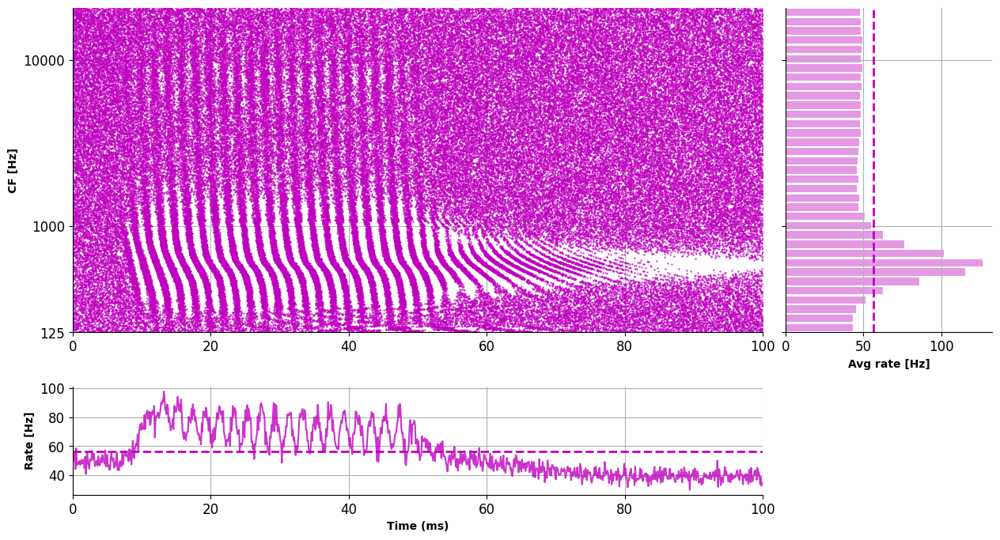

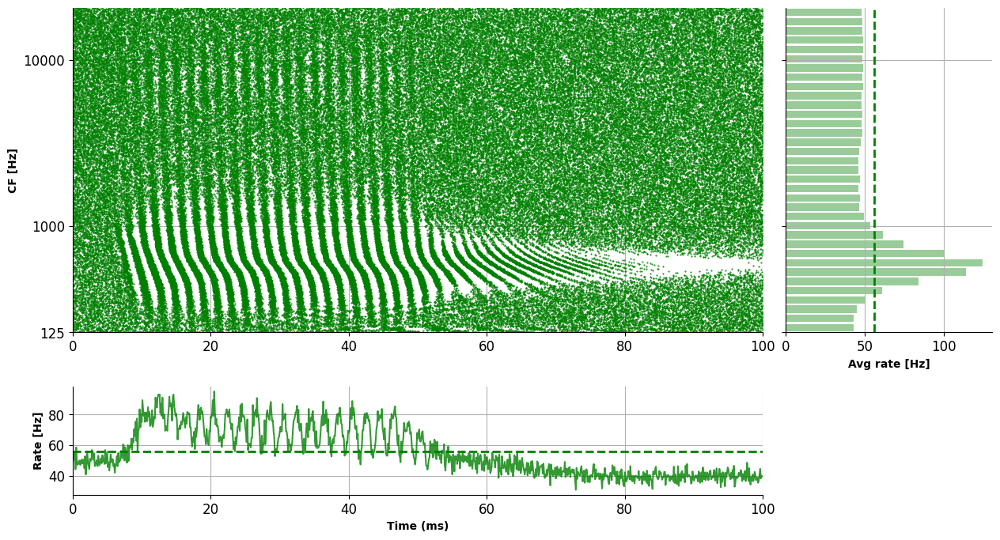

In [ ]:
plot_rasterplot(
    spikes_series = anf.binaural_anf_spiketrain['L'],
    y_ax='cf_custom',
    f_ticks=[125, 1000, 10000],
    hist_rate=True,
    cf_bin_size=1000, #cells
    psth_bin_size=0.1, #ms
    color='m',
)

plot_rasterplot(
    spikes_series = anf.binaural_anf_spiketrain['R'],
    y_ax='cf_custom',
    f_ticks=[125, 1000, 10000],
    hist_rate=True,
    cf_bin_size=1000, #cells
    psth_bin_size=0.1, #ms
    color='g',
)

In [ ]:
def load_ci_spikes(ci_dir, side):
    """
    side: 'left' or 'right'
    """
    path = os.path.join(ci_dir, f'spike_times_{side}.mat')
    data = sio.loadmat(path, simplify_cells=True)
    spike_array = [np.atleast_1d(np.array(s, dtype=float)) for s in data[f'spike_times_{side}']]
    return pd.Series(spike_array, name='spikes')

Avg firing rate: 115.16 Hz
Avg firing rate: 117.53 Hz
Avg firing rate: 157.78 Hz
Avg firing rate: 157.07 Hz
Avg firing rate: 161.13 Hz
Avg firing rate: 163.77 Hz
Avg firing rate: 188.83 Hz
Avg firing rate: 169.71 Hz
Avg firing rate: 179.50 Hz
Avg firing rate: 255.57 Hz


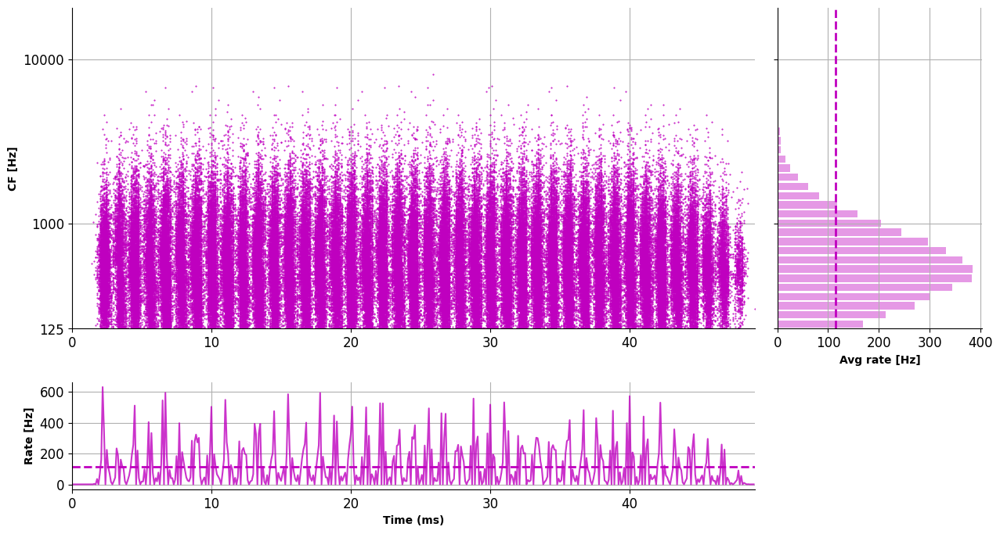

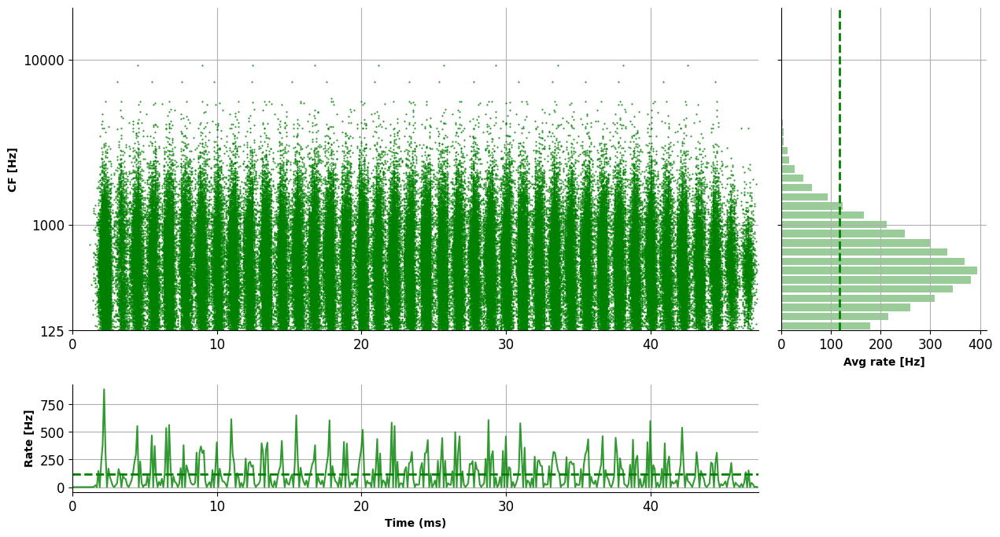

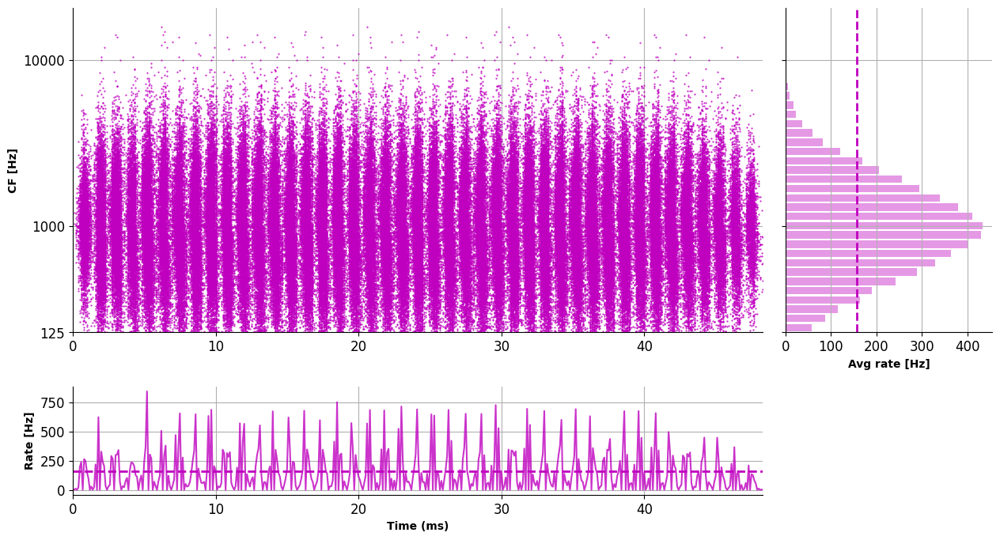

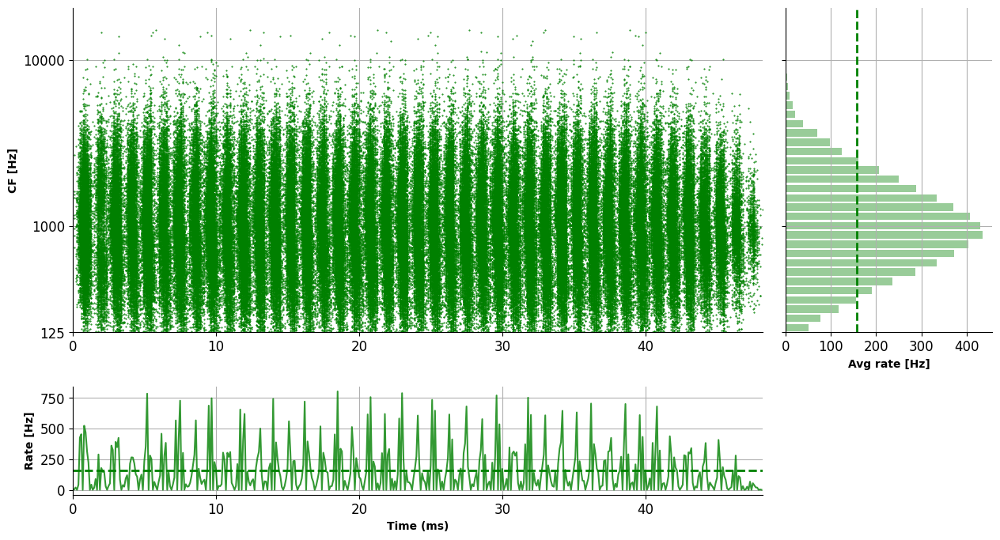

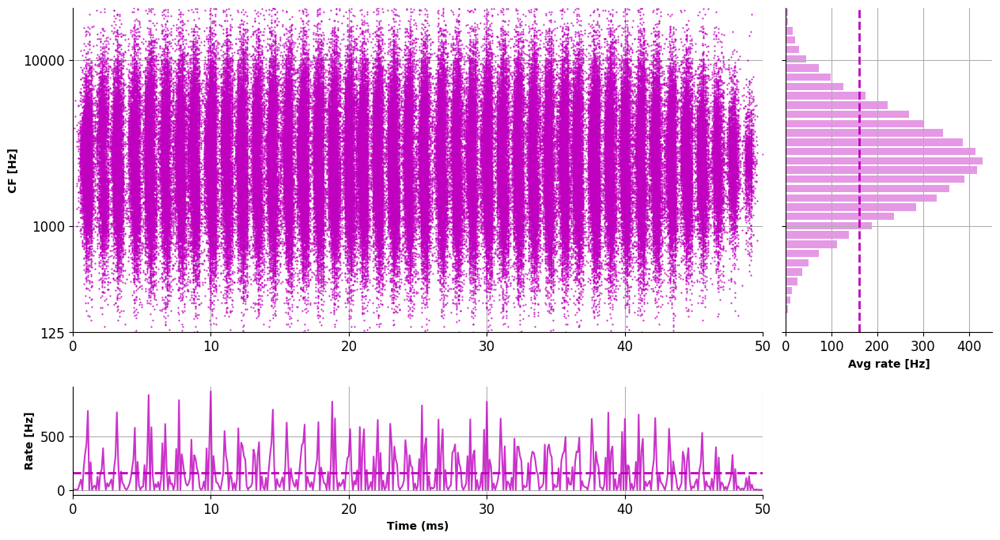

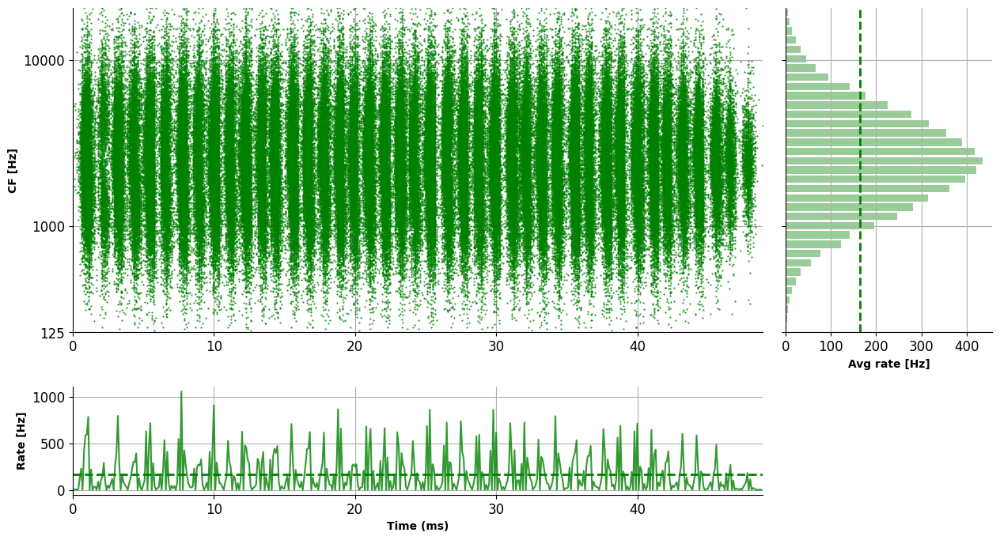

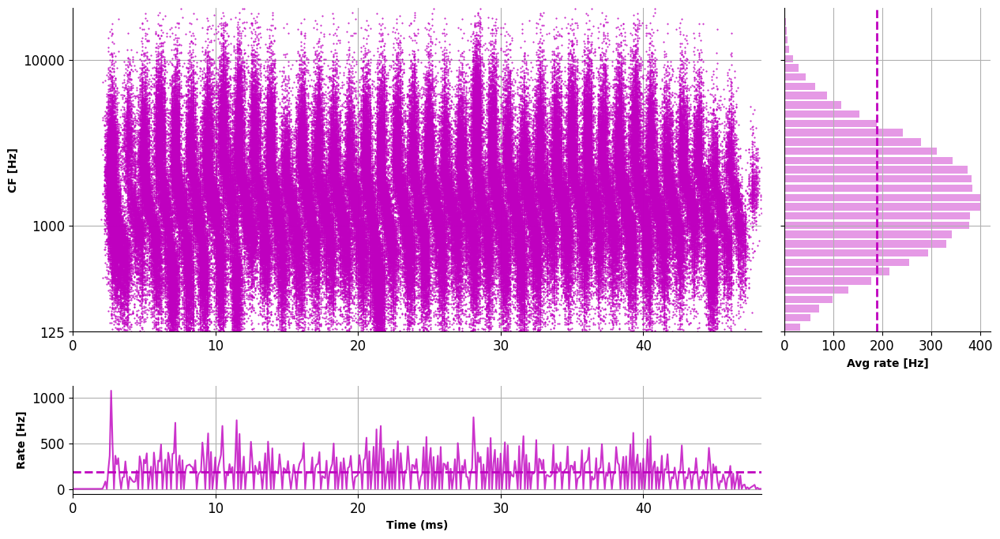

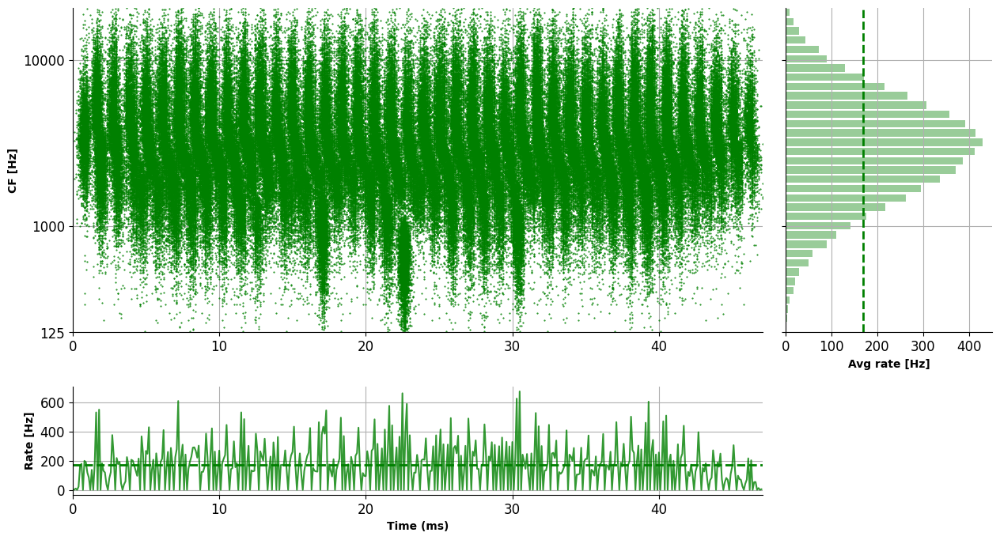

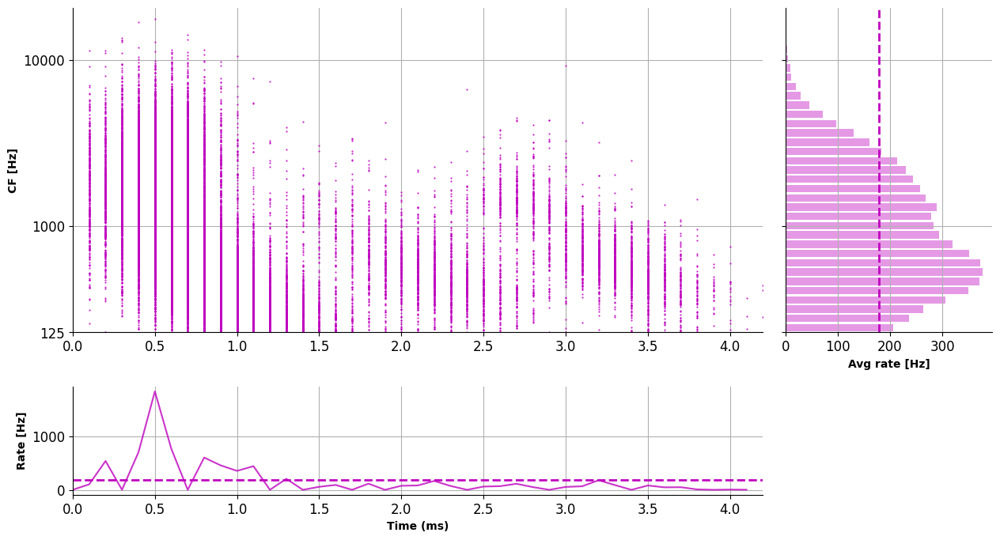

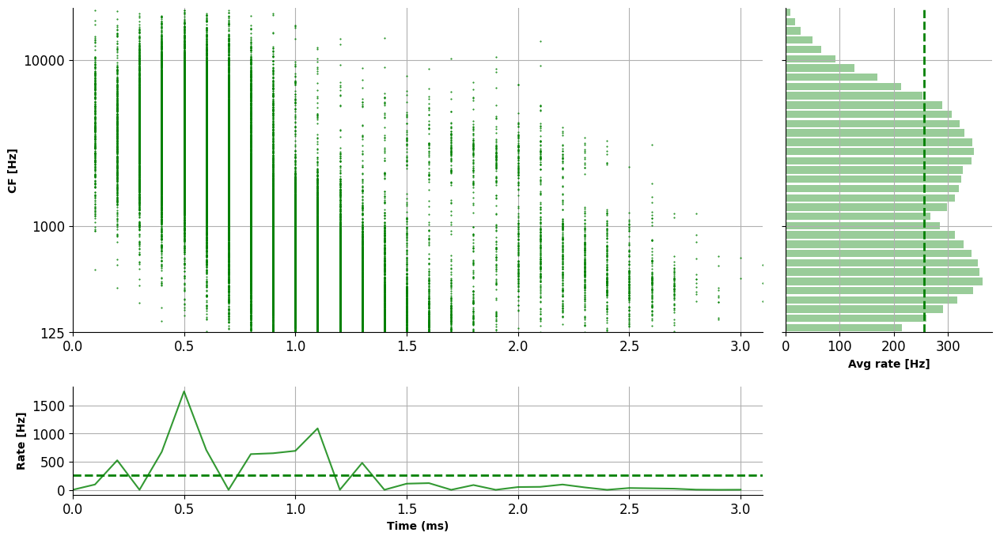

In [ ]:
for name in ['500', '1200', '4000', 'wn', 'click']:    
    ci_dir = os.path.join(Paths.DATA_DIR, 'ANF_SPIKETRAINS', 'CImodel', name)
    left_anf_ci  = load_ci_spikes(ci_dir, 'left')
    right_anf_ci = load_ci_spikes(ci_dir, 'right')

    plot_rasterplot(
        spikes_series = left_anf_ci,
        y_ax='cf_custom',
        f_ticks=[125, 1000, 10000],
        hist_rate=True,
        cf_bin_size=1000, #cells
        psth_bin_size=0.1, #ms
        color='m',
    )
    plot_rasterplot(
        spikes_series = right_anf_ci,
        y_ax='cf_custom',
        f_ticks=[125, 1000, 10000],
        hist_rate=True,
        cf_bin_size=1000, #cells
        psth_bin_size=0.1, #ms
        color='g',
    )

Avg firing rate: 112.72 Hz
Avg firing rate: 114.74 Hz


(<Figure size 1500x800 with 3 Axes>,
 (<Axes: ylabel='CF [Hz]'>,
  <Axes: xlabel='Avg rate [Hz]'>,
  <Axes: xlabel='Time (ms)', ylabel='Rate [Hz]'>))

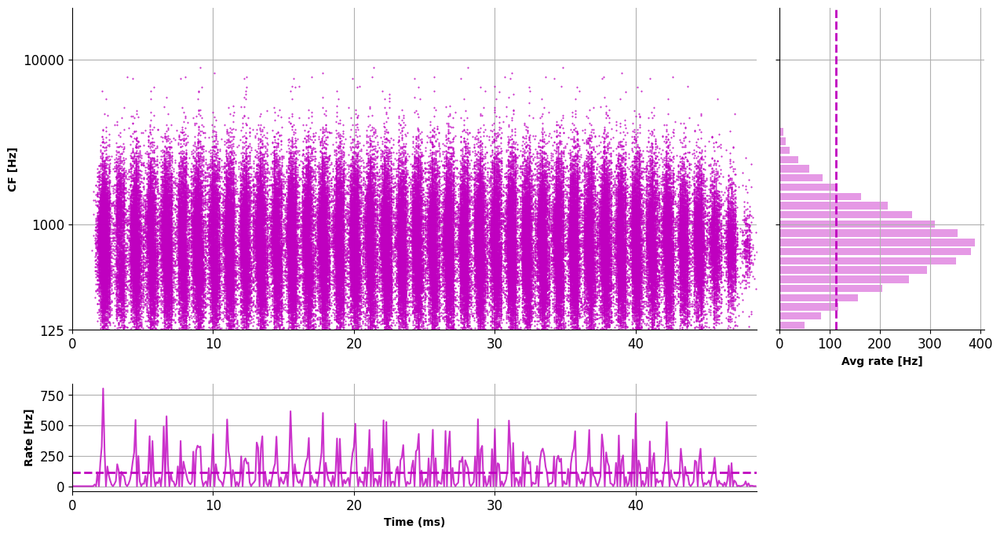

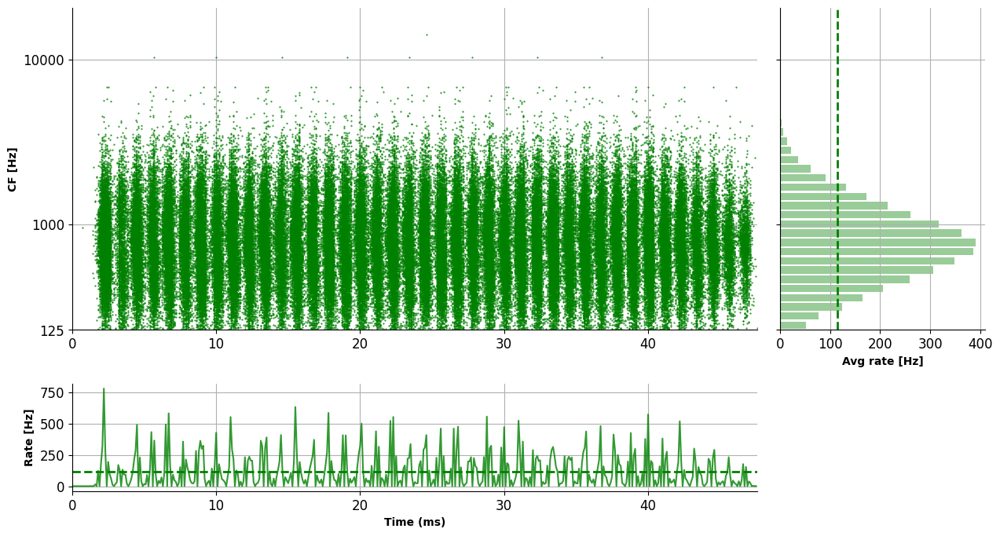

In [ ]:
plot_rasterplot(
    spikes_series = left_anf_ci,
    y_ax='cf_custom',
    f_ticks=[125, 1000, 10000],
    hist_rate=True,
    cf_bin_size=1000, #cells
    psth_bin_size=0.1, #ms
    color='m',
)
plot_rasterplot(
    spikes_series = right_anf_ci,
    y_ax='cf_custom',
    f_ticks=[125, 1000, 10000],
    hist_rate=True,
    cf_bin_size=1000, #cells
    psth_bin_size=0.1, #ms
    color='g',
)

Avg firing rate: 146.08 Hz
Avg firing rate: 148.60 Hz


(<Figure size 1500x800 with 3 Axes>,
 (<Axes: ylabel='CF [Hz]'>,
  <Axes: xlabel='Avg rate [Hz]'>,
  <Axes: xlabel='Time (ms)', ylabel='Rate [Hz]'>))

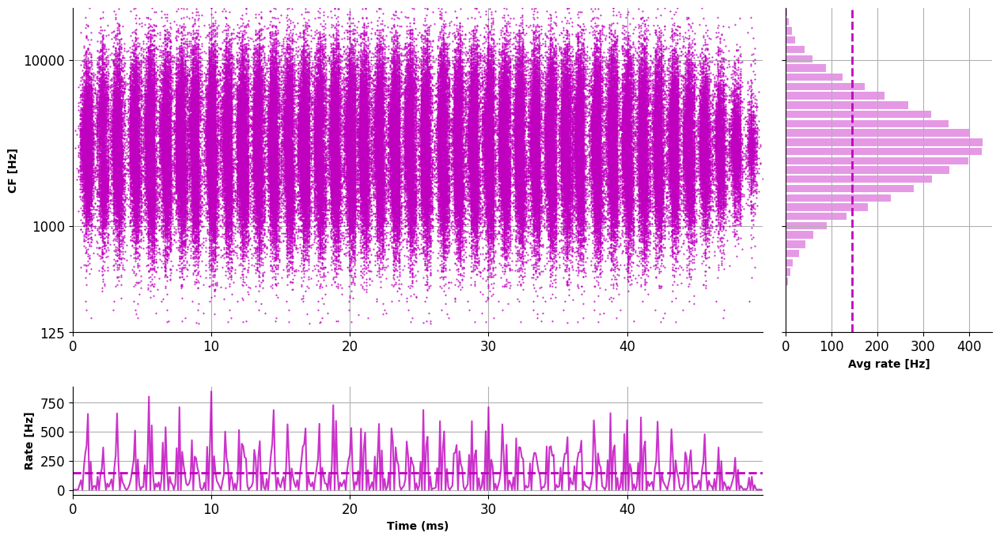

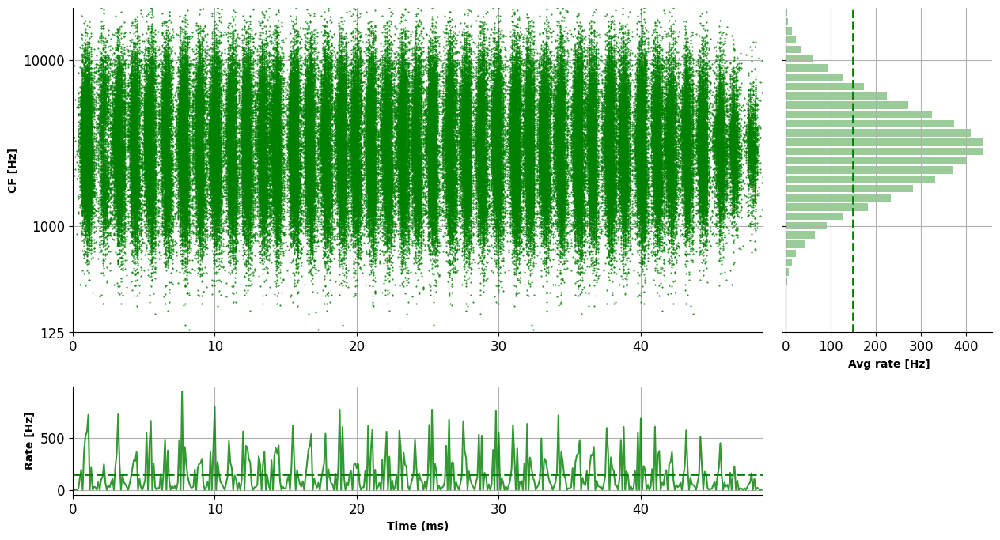

In [ ]:
plot_rasterplot(
    spikes_series = left_anf_ci2,
    y_ax='cf_custom',
    f_ticks=[125, 1000, 10000],
    hist_rate=True,
    cf_bin_size=1000, #cells
    psth_bin_size=0.1, #ms
    color='m',
)
plot_rasterplot(
    spikes_series = right_anf_ci2,
    y_ax='cf_custom',
    f_ticks=[125, 1000, 10000],
    hist_rate=True,
    cf_bin_size=1000, #cells
    psth_bin_size=0.1, #ms
    color='g',
)

Avg firing rate: 141.90 Hz
Avg firing rate: 143.92 Hz


(<Figure size 1500x800 with 3 Axes>,
 (<Axes: ylabel='CF [Hz]'>,
  <Axes: xlabel='Avg rate [Hz]'>,
  <Axes: xlabel='Time (ms)', ylabel='Rate [Hz]'>))

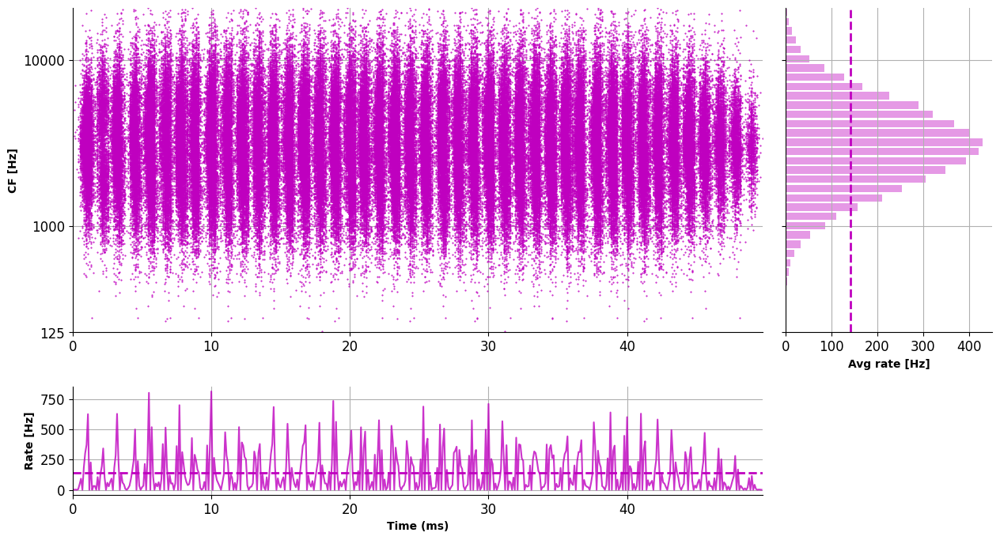

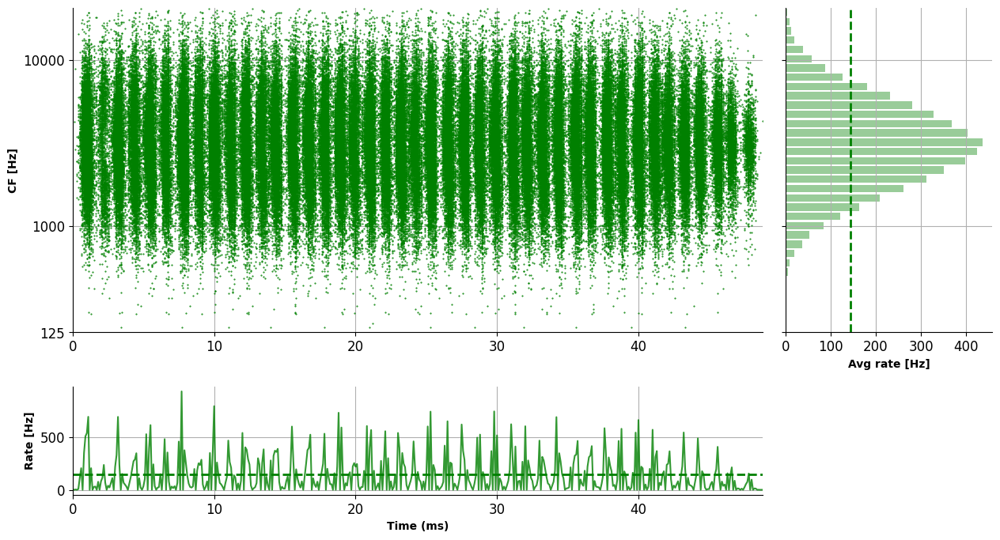

In [ ]:
plot_rasterplot(
    spikes_series = left_anf_ci3,
    y_ax='cf_custom',
    f_ticks=[125, 1000, 10000],
    hist_rate=True,
    cf_bin_size=1000, #cells
    psth_bin_size=0.1, #ms
    color='m',
)
plot_rasterplot(
    spikes_series = right_anf_ci3,
    y_ax='cf_custom',
    f_ticks=[125, 1000, 10000],
    hist_rate=True,
    cf_bin_size=1000, #cells
    psth_bin_size=0.1, #ms
    color='g',
)